In [1]:
import tensorflow as tf
import numpy as np
from bfseg.utils.metrics import IgnorantBalancedMeanIoU, IgnorantMeanIoU, IgnorantBalancedAccuracyMetric, \
  IgnorantAccuracyMetric
import tensorflow as tf
import matplotlib.pyplot as plt
import os
from PIL import Image
import numpy as np
from bfseg.utils.evaluation import scoreAndPlotPredictions

In [3]:
model = tf.keras.models.load_model('/home/rene/best_PSP_model.h5', custom_objects={'tf': tf})

In [4]:

from bfseg.data.meshdist.dataLoader import DataLoader

In [5]:
DL = DataLoader(
          "/home/rene/cla_dataset/fused", [480, 720],
          validationDir="/home/rene/hiveLabels",
    shuffle= False,
          validationMode="CLA",
          batchSize=1,
          loadDepth=False,
          cropOptions={
              'top': 0,
              'bottom': 0
          })

In [6]:
def pred(img):
    return  model.predict(img)
    #return  np.random.rand(1,480,720,2)
    #return prediction

In [26]:
def pred_all_0(img):
    #prediction =  model.predict(img)
    vec =   np.random.rand(1,480,720,2)
    vec[...,0] = 10
    return vec
    #return prediction

In [24]:
def pred_all_1(img):
    #prediction =  model.predict(img)
    vec =   np.random.rand(1,480,720,2)
    vec[...,1] = 10
    return vec
    #return prediction

Accuracy on validation set: 0.80045563
Balanced Accuracy on validation set: 0.78719556
mIoU on validation set: 0.6485555
Balanced mIoU on validation set: 0.64884853
Positive = Foreground, Negative = Background
TPR on validation set: 0.8201219
TNR on validation set: 0.76280195
Precision  on validation set: 0.8687651


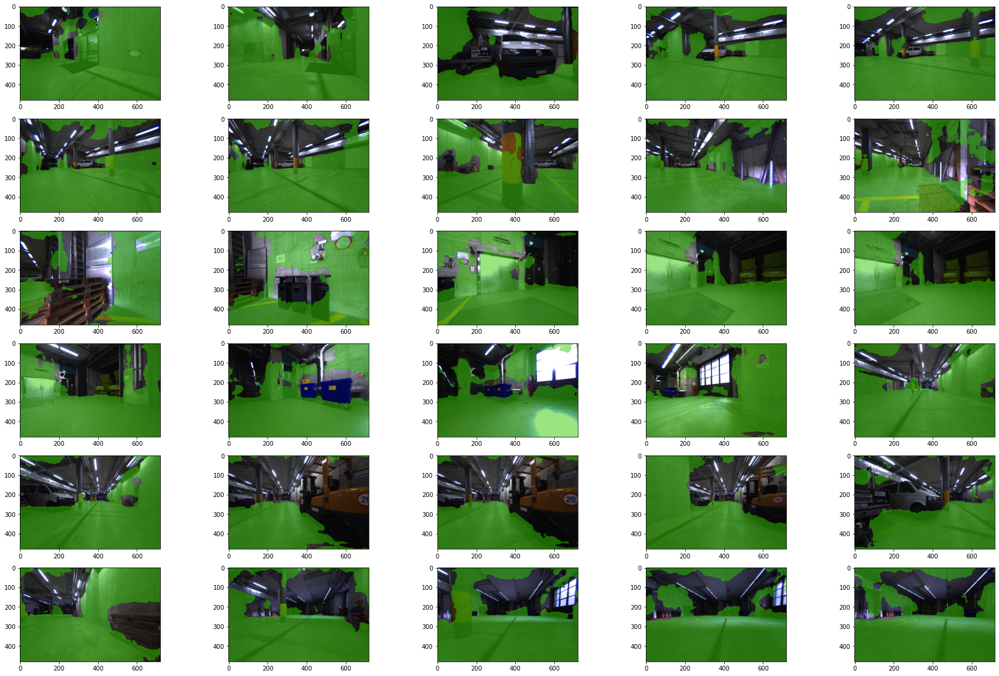

In [16]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (30,20)

scoreAndPlotPredictions(pred,
                        DL.getValidationDataset(),
                        DL.validationSize,
                        plot=True,
                        outFolder=None,
                        tag="CLA",
                        exportPredictions=False) 


In [8]:
DL = DataLoader(
          "/home/rene/cla_dataset/fused", [480, 720],
          validationDir="/home/rene/hiveLabels",
          validationMode="ARCHE",
          batchSize=1,
          loadDepth=False,
          cropOptions={
              'top': 0,
              'bottom': 0
          })

Accuracy on validation set: 0.6382899
Balanced Accuracy on validation set: 0.6388119
mIoU on validation set: 0.46610188
Balanced mIoU on validation set: 0.46858248
Positive = Foreground, Negative = Background
TPR on validation set: 0.60106134
TNR on validation set: 0.6966703
Precision  on validation set: 0.75653577


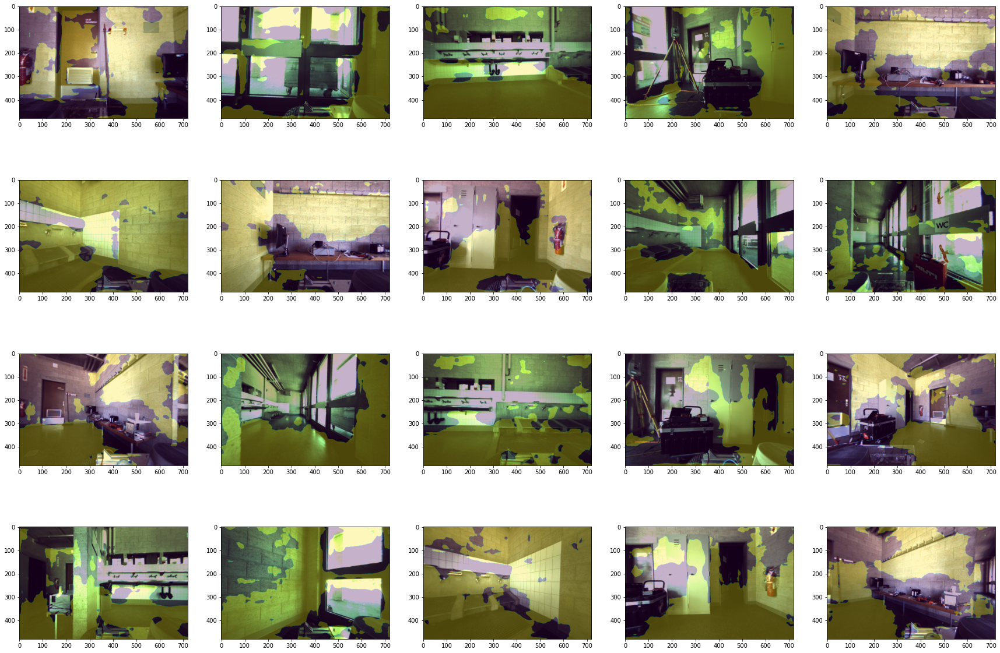

In [10]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (30,21)

scoreAndPlotPredictions(lambda x: model.predict(x),
                        DL.getValidationDataset(),
                        DL.validationSize,
                        plot=True,
                        outFolder=None,
                        tag="CLA",
                        exportPredictions=False) 


Accuracy on validation set: 0.50059384
Balanced Accuracy on validation set: 0.50111234
mIoU on validation set: 0.3265774
Balanced mIoU on validation set: 0.3343222
Positive = Foreground, Negative = Background
TPR on validation set: 0.4997192
TNR on validation set: 0.5022685
Precision  on validation set: 0.6578015


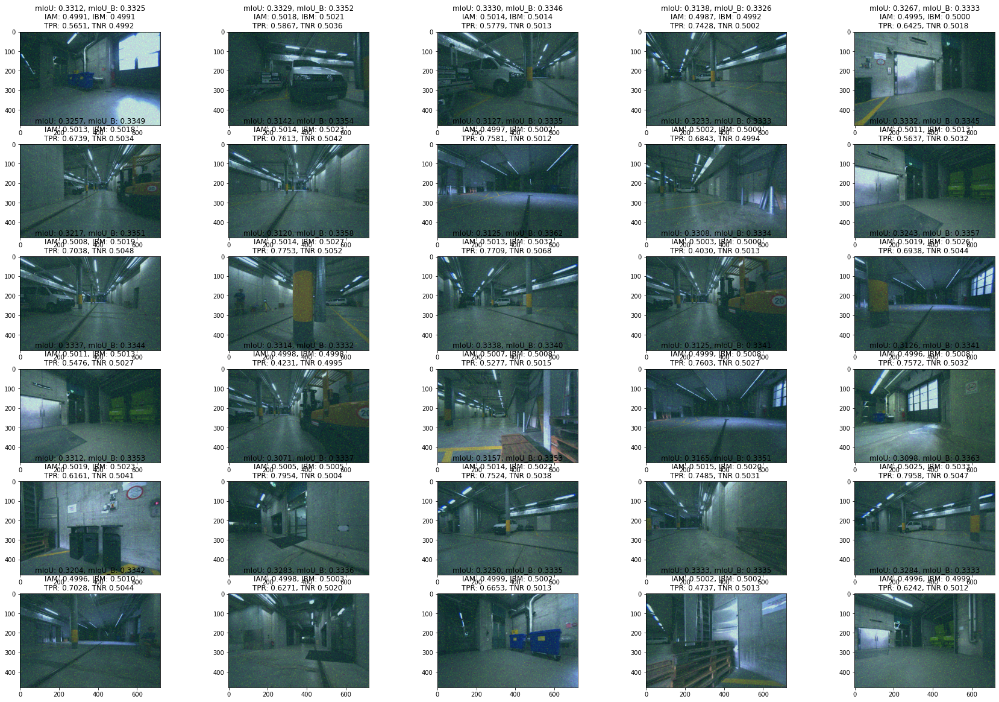

In [18]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (30,20)

scoreAndPlotPredictions(pred_all_0,
                        DL.getValidationDataset(),
                        DL.validationSize,
                        plot=True,
                        outFolder=None,
                        tag="CLA",
                        exportPredictions=False) 


Accuracy on validation set: 0.49994057
Balanced Accuracy on validation set: 0.49987686
mIoU on validation set: 0.32589626
Balanced mIoU on validation set: 0.33322388
Positive = Foreground, Negative = Background
TPR on validation set: 0.50002784
TNR on validation set: 0.49977356
Precision  on validation set: 0.65681434


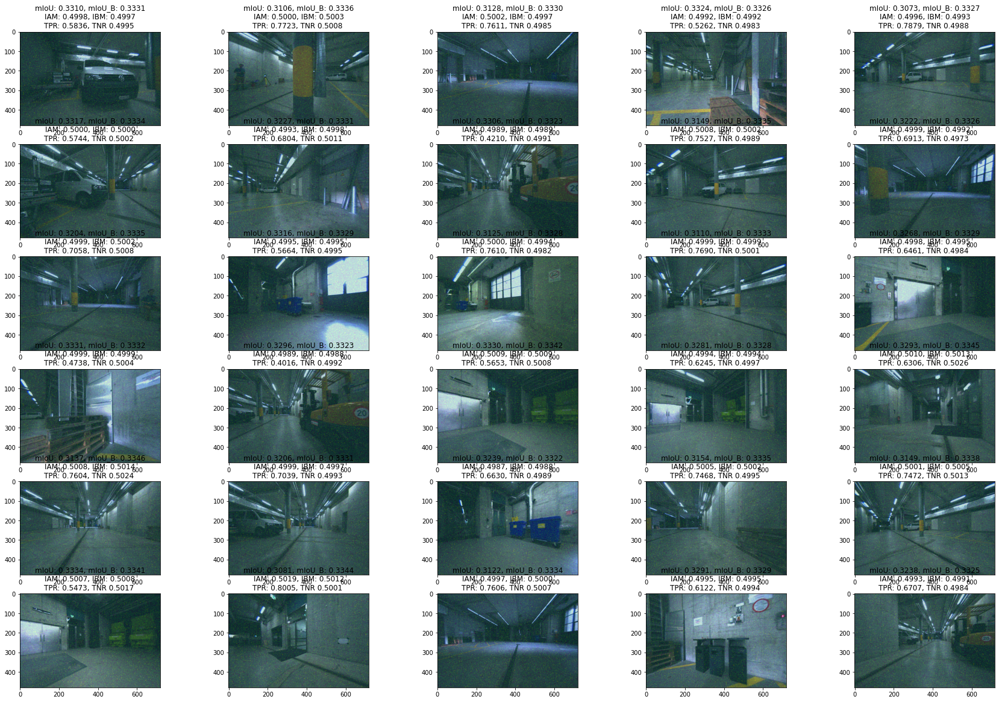

In [14]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (30,20)

scoreAndPlotPredictions(pred,
                        DL.getValidationDataset(),
                        DL.validationSize,
                        plot=True,
                        outFolder=None,
                        tag="CLA",
                        exportPredictions=False) 


Accuracy on validation set: 0.80045563
Balanced Accuracy on validation set: 0.78719544
mIoU on validation set: 0.6485554
Balanced mIoU on validation set: 0.64884824
Positive = Foreground, Negative = Background
TPR on validation set: 0.82012236
TNR on validation set: 0.76280105
Precision  on validation set: 0.8687648


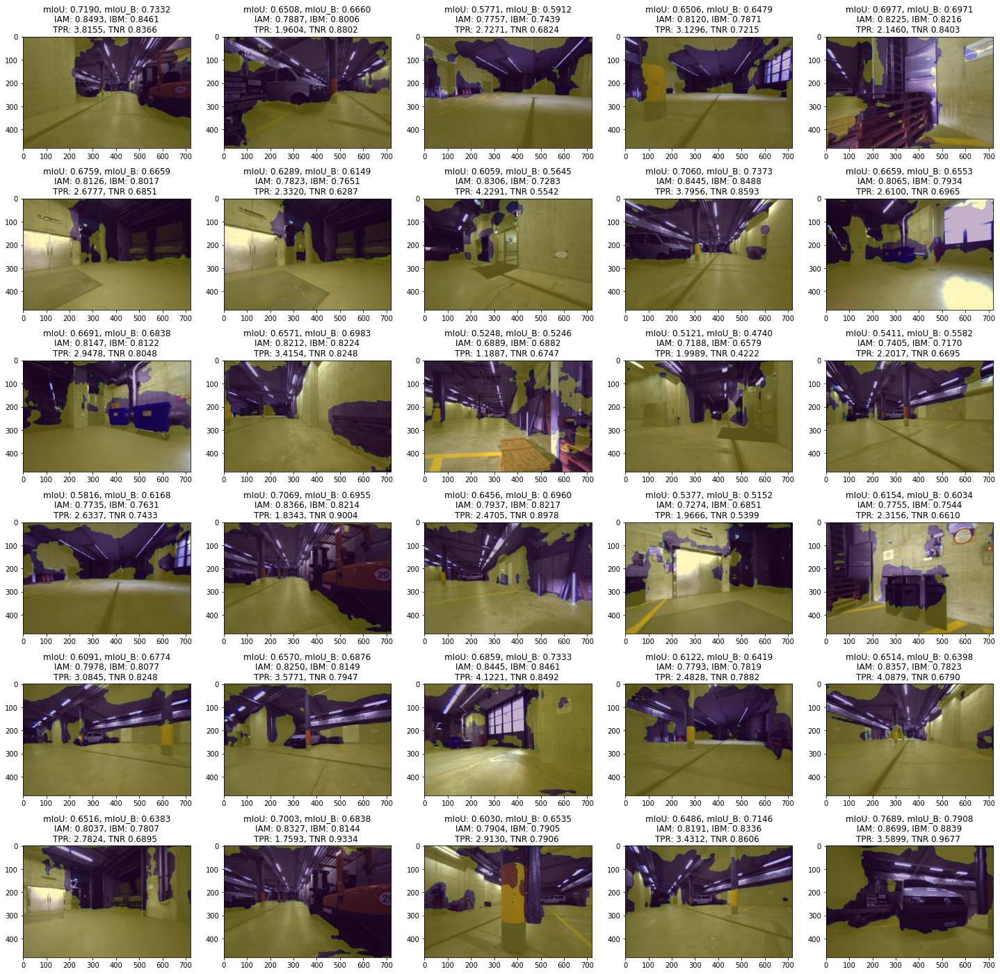

In [16]:
import matplotlib.pyplot as plt

def pred(img):
    prediction = model(img)
    prediction = tf.stack([prediction[...,0], prediction[...,1] + 0], axis = -1).numpy()
    return prediction

plt.rcParams["figure.figsize"] = (25,25)
scoreAndPlotPredictions(pred,
                        DL.getValidationDataset(),
                        DL.validationSize,
                        plot=True,
                        outFolder=None,
                        tag="CLA",
                        exportPredictions=False) 

